# Retrieval Imagination Visualizer

Load multiple retrieval runs produced by `src/retrieval_imagination.py`, summarize precision@k across corruption ranges, and drill into qualitative grids for any run you choose.

In [1]:
from pathlib import Path
import json
import random
from typing import Dict, List

from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import display
REPO_ROOT = Path("..").resolve()


In [2]:
RESULTS_ROOT = REPO_ROOT / "results"
RESULTS_GLOB = "retrieval_imagination_*"
RESULTS_DIRS = sorted(
    p for p in RESULTS_ROOT.glob(RESULTS_GLOB) if (p / "metrics.json").exists()
)

if not RESULTS_DIRS:
    raise FileNotFoundError("No retrieval_imagination_* result directories with metrics.json found.")

runs: List[Dict] = []
for directory in RESULTS_DIRS:
    metrics_path = directory / "metrics.json"
    samples_path = directory / "samples.json"
    if not samples_path.exists():
        continue
    runs.append(
        {
            "name": directory.name,
            "dir": directory,
            "metrics": json.loads(metrics_path.read_text()),
            "samples": json.loads(samples_path.read_text()),
        }
    )

if not runs:
    raise ValueError("Found directories but none had both metrics.json and samples.json.")

print(f"Loaded {len(runs)} runs:")
for run in runs:
    metrics = run["metrics"]
    corrupt_range = metrics.get("corrupt_range")
    print(
        f" - {run['name']} | scheme={metrics.get('scheme')} | range={corrupt_range} | num_queries={metrics.get('num_queries')}"
    )


Loaded 6 runs:
 - retrieval_imagination_occlude_010 | scheme=occlude | range=[0.1, 0.1] | num_queries=512
 - retrieval_imagination_occlude_020 | scheme=occlude | range=[0.2, 0.2] | num_queries=512
 - retrieval_imagination_occlude_030 | scheme=occlude | range=[0.3, 0.3] | num_queries=512
 - retrieval_imagination_occlude_040 | scheme=occlude | range=[0.4, 0.4] | num_queries=512
 - retrieval_imagination_occlude_050 | scheme=occlude | range=[0.5, 0.5] | num_queries=512
 - retrieval_imagination_occlude_090 | scheme=occlude | range=[0.9, 0.9] | num_queries=512


## Precision Across Runs

In [3]:
summary_rows = []
for run in runs:
    metrics = run["metrics"]
    precision = metrics.get("precision", {})
    corrupt_range = metrics.get("corrupt_range") or [None, None]
    summary_rows.append(
        {
            "run": run["name"],
            "scheme": metrics.get("scheme"),
            "corrupt_min": corrupt_range[0],
            "corrupt_max": corrupt_range[1],
            "k": metrics.get("k"),
            "num_queries": metrics.get("num_queries"),
            "fragment@k": precision.get("fragment"),
            "reconstruction@k": precision.get("reconstruction"),
            "clean@k": precision.get("clean"),
        }
    )

summary_df = (
    pd.DataFrame(summary_rows)
    .sort_values(["scheme", "corrupt_min"], na_position="last")
    .reset_index(drop=True)
)
display(summary_df)


,run,scheme,corrupt_min,corrupt_max,k,num_queries,fragment@k,reconstruction@k,clean@k
0,retrieval_imagination_occlude_010,occlude,0.1,0.1,5,512,0.988672,0.0,0.991016
1,retrieval_imagination_occlude_020,occlude,0.2,0.2,5,512,0.987891,0.0,0.991016
2,retrieval_imagination_occlude_030,occlude,0.3,0.3,5,512,0.988281,0.0,0.991016
3,retrieval_imagination_occlude_040,occlude,0.4,0.4,5,512,0.974609,0.0,0.991016
4,retrieval_imagination_occlude_050,occlude,0.5,0.5,5,512,0.948828,0.0,0.991016
5,retrieval_imagination_occlude_090,occlude,0.9,0.9,5,512,0.264063,0.0,0.991016


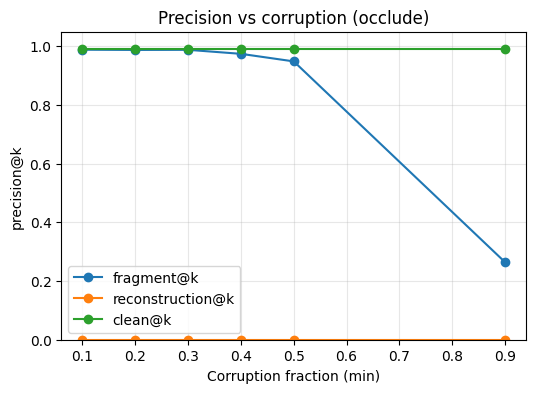

In [4]:
for scheme, sub_df in summary_df.groupby("scheme"):
    fig, ax = plt.subplots(figsize=(6, 4))
    x = sub_df["corrupt_min"]
    for variant in ["fragment@k", "reconstruction@k", "clean@k"]:
        ax.plot(x, sub_df[variant], marker="o", label=variant)
    ax.set_xlabel("Corruption fraction (min)")
    ax.set_ylabel("precision@k")
    ax.set_title(f"Precision vs corruption ({scheme})")
    ax.set_ylim(0.0, 1.05)
    ax.grid(True, alpha=0.3)
    ax.legend()
    plt.show()


## Select a run for qualitative inspection

In [5]:
RUN_NAME = runs[0]["name"]  # change to another entry from summary_df if desired
ACTIVE_RUN = next((run for run in runs if run["name"] == RUN_NAME), None)
if ACTIVE_RUN is None:
    raise ValueError(f"Run {RUN_NAME} not found.")

RESULTS_DIR = ACTIVE_RUN["dir"]
metrics = ACTIVE_RUN["metrics"]
samples = ACTIVE_RUN["samples"]
print(f"Inspecting run {RUN_NAME} (scheme={metrics.get('scheme')}, range={metrics.get('corrupt_range')})")
print(f"Stored at {RESULTS_DIR}")
print(f"Num visualization records: {len(samples.get('records', []))}")


Inspecting run retrieval_imagination_occlude_010 (scheme=occlude, range=[0.1, 0.1])
Stored at /orcd/scratch/orcd/010/jianggy/large-embedding-models/RAE/results/retrieval_imagination_occlude_010
Num visualization records: 8


In [6]:
def resolve_path(path_str: str) -> Path:
    path = Path(path_str)
    if not path.is_absolute():
        path = (REPO_ROOT / path).resolve()
    return path

def show_query(record: Dict):
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    fragment = Image.open(resolve_path(record["fragment_png"]))
    recon = Image.open(resolve_path(record["recon_png"]))
    axes[0].imshow(fragment)
    axes[0].set_title(f"Fragment\nlabel: {record['label_name']}")
    axes[0].axis("off")
    axes[1].imshow(recon)
    axes[1].set_title("RAE Reconstruction x_hat")
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()
def show_retrievals(record: Dict, variant: str, max_k: int = 5):
    entries = record.get("retrievals", {}).get(variant, [])[:max_k]
    if not entries:
        print(f"No retrievals stored for {variant}.")
        return
    cols = len(entries)
    fig, axes = plt.subplots(1, cols, figsize=(3 * cols, 3))
    if cols == 1:
        axes = [axes]
    for ax, entry in zip(axes, entries):
        img = Image.open(resolve_path(entry["path"]))
        ax.imshow(img)
        title = f"{entry['label_name']}\nscore={entry['score']:.3f}"
        ax.set_title(title)
        ax.axis("off")
    fig.suptitle(f"Top-{cols} retrieved via {variant}")
    plt.tight_layout()
    plt.show()
def inspect_record(record: Dict, max_k: int):
    print(f"Query #{record['query_index']} | label: {record['label_name']}")
    print(f"Clean image: {record['clean_path']}")
    show_query(record)
    for variant in ("fragment", "reconstruction", "clean"):
        show_retrievals(record, variant, max_k=max_k)
print("Helper functions ready.")


Helper functions ready.


## Inspect a sample

Query #6 | label: n01440764
Clean image: /home/jianggy/.fastai/data/imagenette2-320/val/n01440764/ILSVRC2012_val_00030740.JPEG


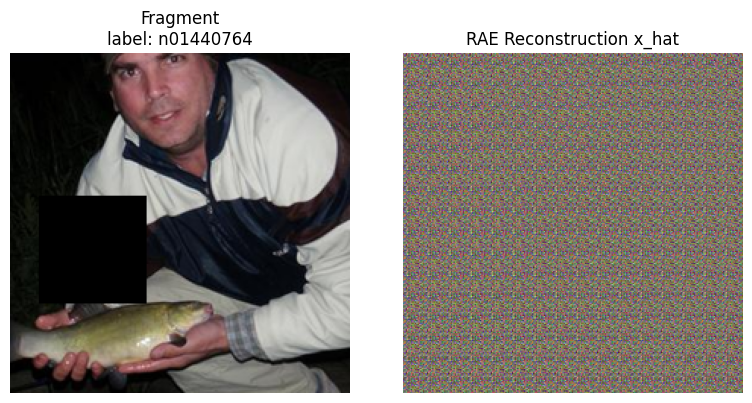

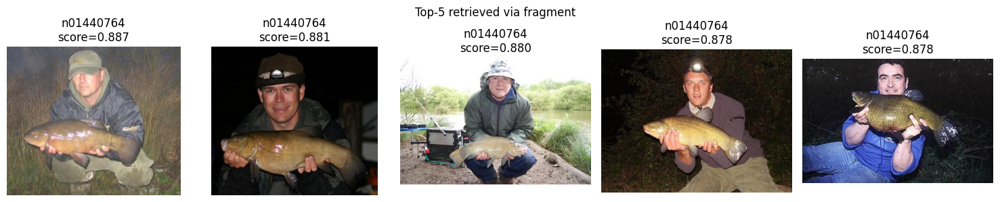

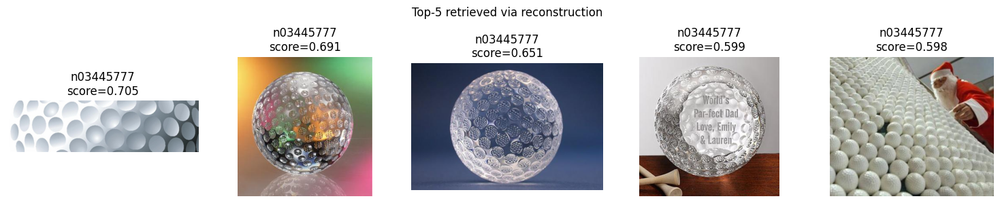

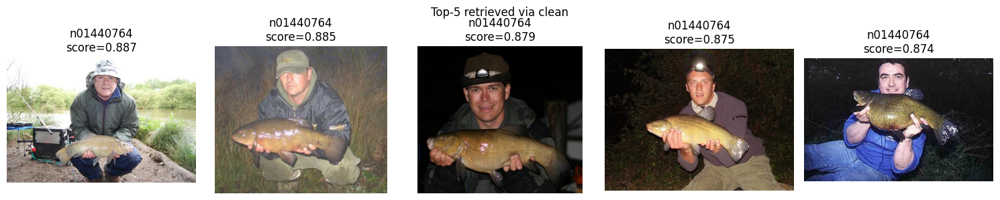

In [7]:
SAMPLE_INDEX = None  # set to an integer to pick deterministically
records = samples.get("records", [])
if not records:
    raise ValueError("samples.json does not contain any visualization records.")

if SAMPLE_INDEX is not None:
    record = records[SAMPLE_INDEX]
else:
    record = random.choice(records)
inspect_record(record, max_k=metrics["k"])


## Compare samples across corruption levels

Select multiple run names to visualize different fragment severities side-by-side.

Run: retrieval_imagination_occlude_010 | scheme=occlude | range=[0.1, 0.1] | k=5
Num queries: 512
Query #7 | label: n01440764
Clean image: /home/jianggy/.fastai/data/imagenette2-320/val/n01440764/ILSVRC2012_val_00037861.JPEG


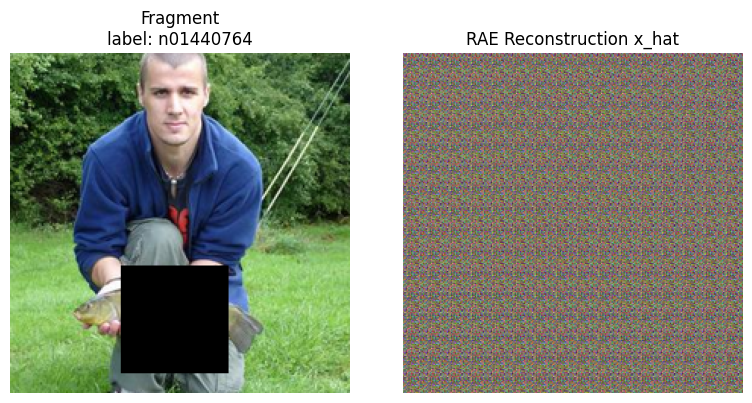

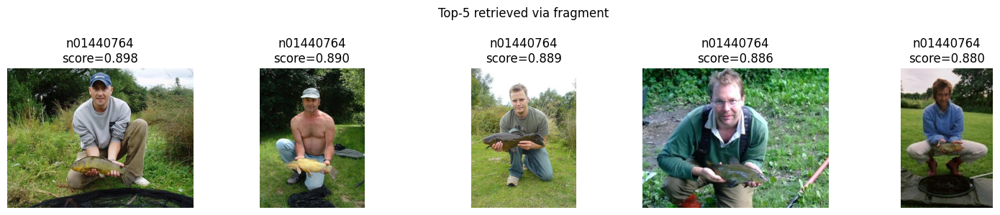

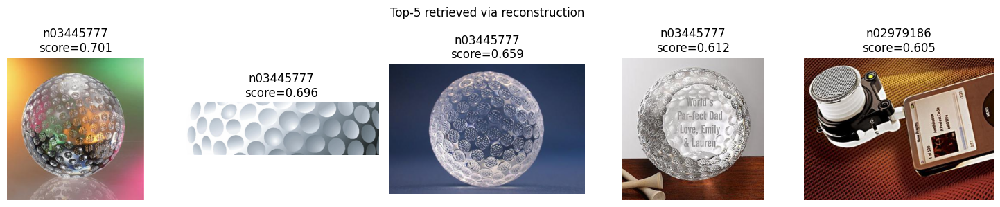

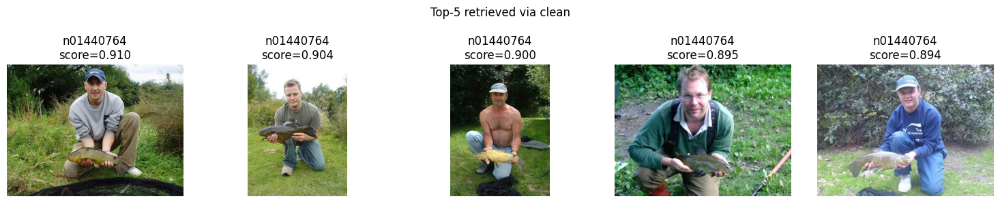

Run: retrieval_imagination_occlude_020 | scheme=occlude | range=[0.2, 0.2] | k=5
Num queries: 512
Query #1 | label: n01440764
Clean image: /home/jianggy/.fastai/data/imagenette2-320/val/n01440764/ILSVRC2012_val_00009191.JPEG


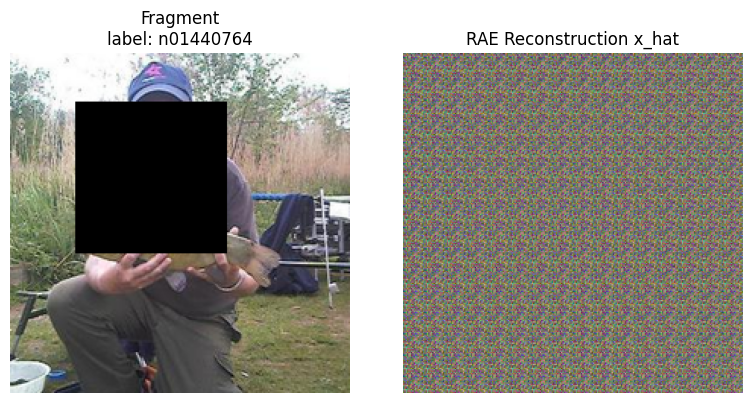

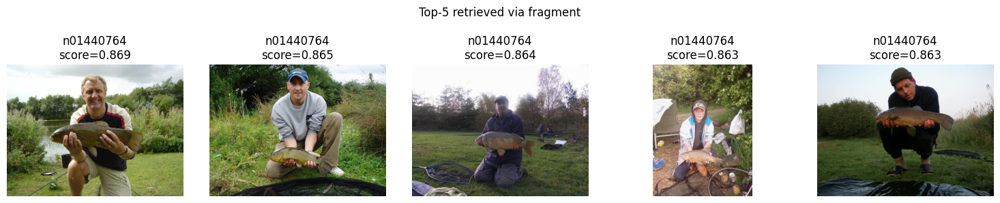

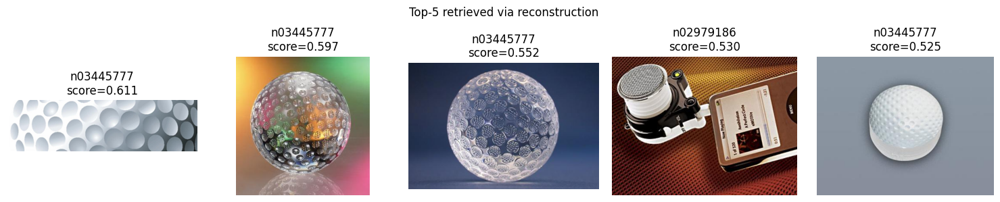

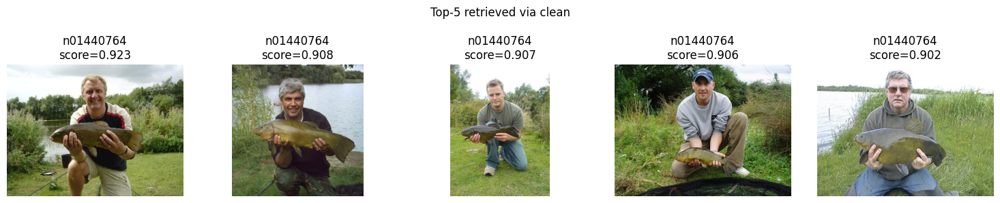

Run: retrieval_imagination_occlude_030 | scheme=occlude | range=[0.3, 0.3] | k=5
Num queries: 512
Query #5 | label: n01440764
Clean image: /home/jianggy/.fastai/data/imagenette2-320/val/n01440764/ILSVRC2012_val_00029930.JPEG


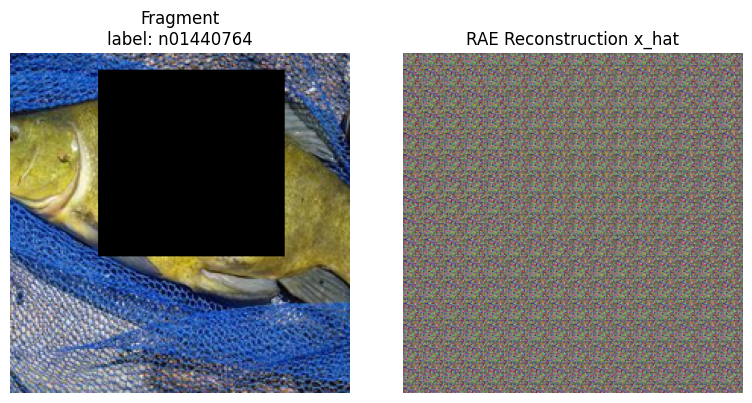

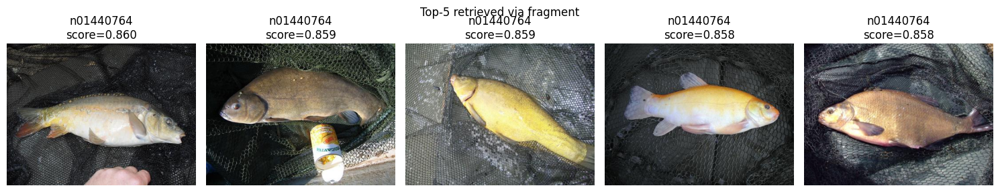

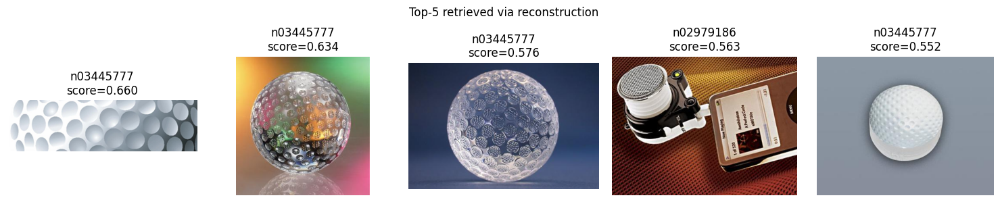

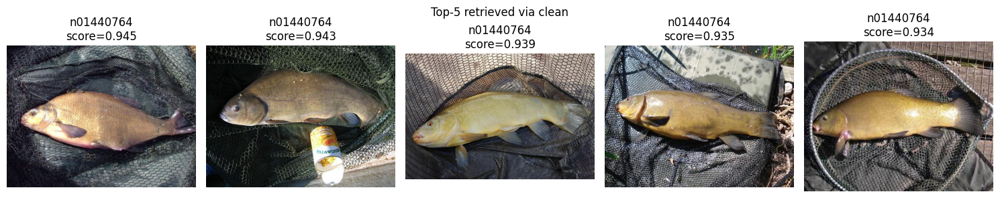

Run: retrieval_imagination_occlude_040 | scheme=occlude | range=[0.4, 0.4] | k=5
Num queries: 512
Query #6 | label: n01440764
Clean image: /home/jianggy/.fastai/data/imagenette2-320/val/n01440764/ILSVRC2012_val_00030740.JPEG


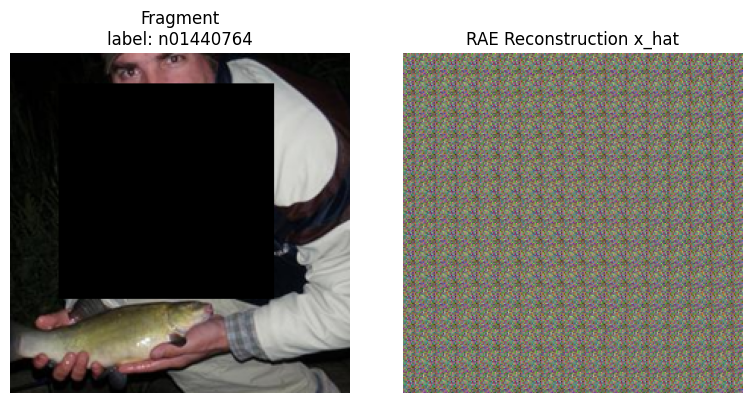

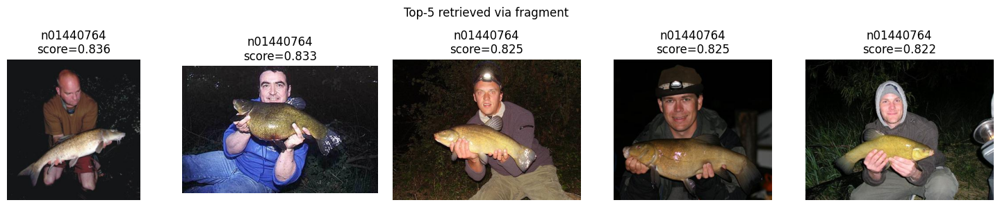

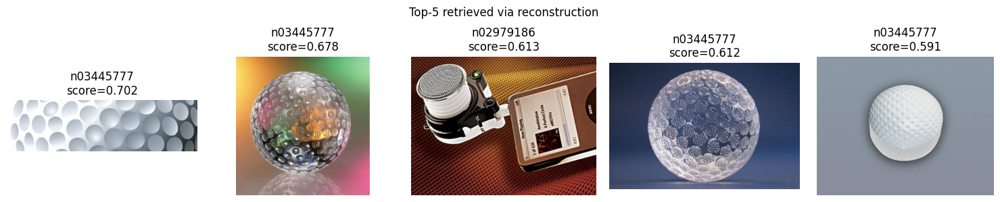

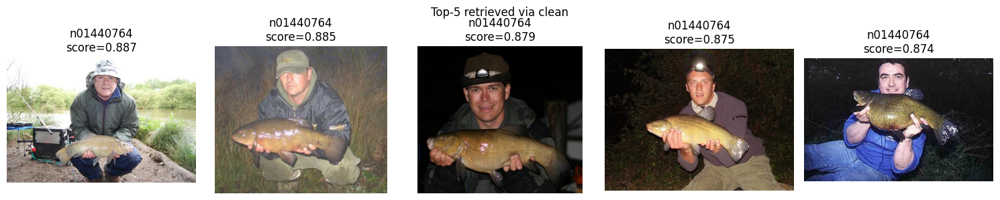

Run: retrieval_imagination_occlude_050 | scheme=occlude | range=[0.5, 0.5] | k=5
Num queries: 512
Query #4 | label: n01440764
Clean image: /home/jianggy/.fastai/data/imagenette2-320/val/n01440764/ILSVRC2012_val_00021740.JPEG


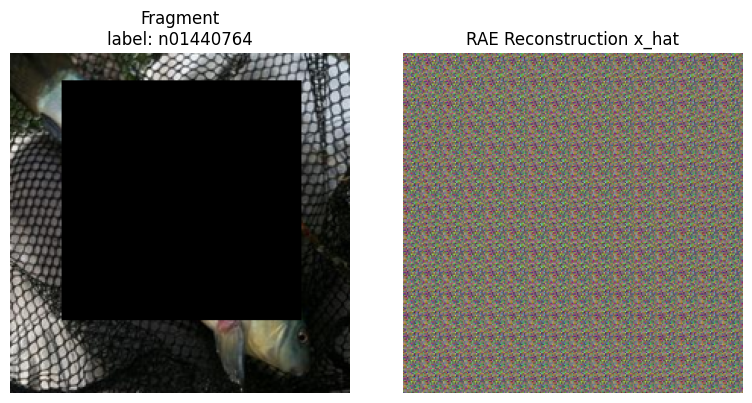

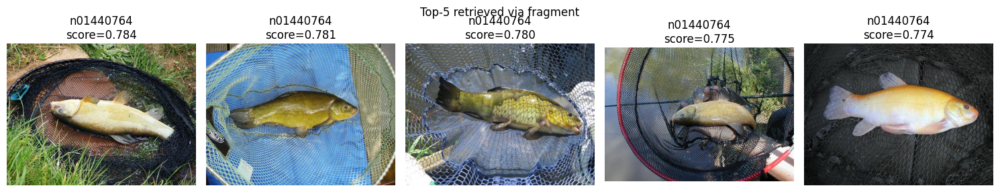

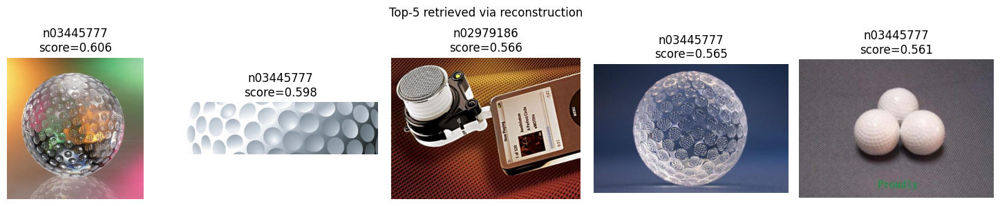

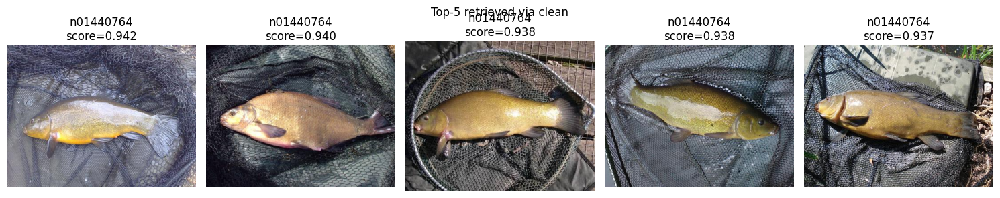

Run: retrieval_imagination_occlude_090 | scheme=occlude | range=[0.9, 0.9] | k=5
Num queries: 512
Query #4 | label: n01440764
Clean image: /home/jianggy/.fastai/data/imagenette2-320/val/n01440764/ILSVRC2012_val_00021740.JPEG


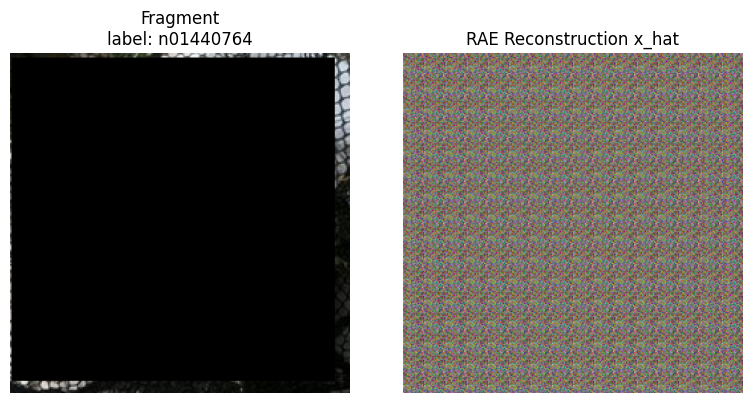

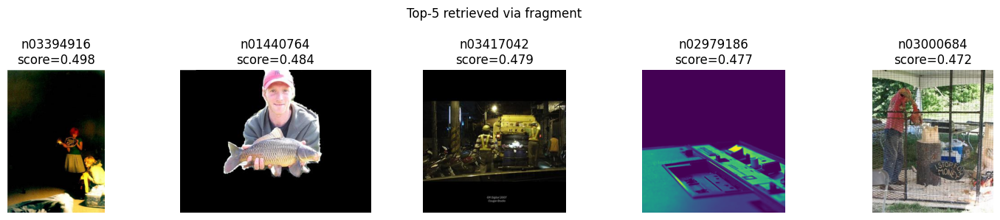

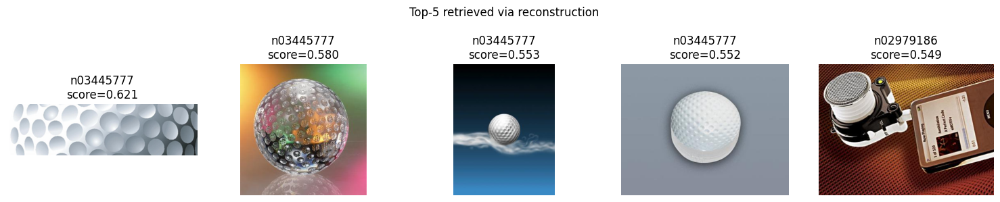

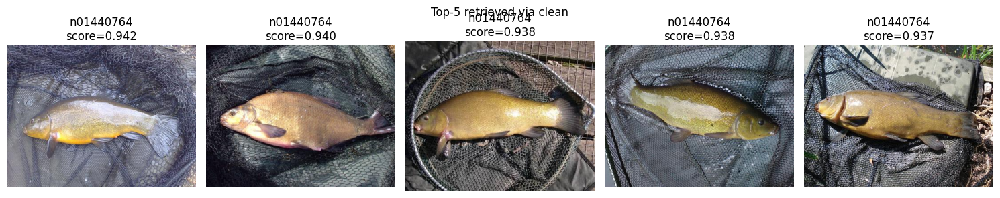

In [8]:
RUN_NAMES = [run['name'] for run in runs]  # edit to a subset like ['retrieval_imagination_occlude_010', 'retrieval_imagination_occlude_090']
MULTI_SAMPLE_INDEX = None  # optional shared index for reproducibility

def select_run(name: str):
    return next((r for r in runs if r['name'] == name), None)

def pick_record(run, sample_index=None):
    records = run['samples'].get('records', [])
    if not records:
        raise ValueError(f"Run {run['name']} has no visualization records.")
    if sample_index is not None and 0 <= sample_index < len(records):
        return records[sample_index]
    return random.choice(records)

for name in RUN_NAMES:
    run = select_run(name)
    if run is None:
        print(f"Run {name} not found, skipping.")
        continue
    metrics = run['metrics']
    record = pick_record(run, MULTI_SAMPLE_INDEX)
    print('=' * 80)
    print(f"Run: {name} | scheme={metrics.get('scheme')} | range={metrics.get('corrupt_range')} | k={metrics.get('k')}")
    print(f"Num queries: {metrics.get('num_queries')}")
    inspect_record(record, max_k=metrics.get('k', 5))
